# **ASSIGNMENT 4**

Author: Jorge Gonzalez Lopez

CWID: A20474413

Semester: Spring 2021


## Import libraries

In [1]:
import numpy as np
import scipy.signal as sc
import cmath
import pickle
import pandas as pd

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras import optimizers
from keras.utils import to_categorical
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras import backend as K


import json
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from sklearn.model_selection import KFold
import shutil
import os



%matplotlib inline

# Question 1: Binary classification

## Pre-processed the data 
(just once as the results have been saved)

In [3]:
def get_images(class_name, path, start_number, number_images):
  
  x = []
  y = []

  for i in range(start_number,start_number + number_images):
    
    if i == 666:
      continue

    xt = []
    url = path + '/' + class_name + '/' + str(i) + '.jpg'
    img = image.load_img(url, target_size=(250, 250))
    img_array = image.img_to_array(img)
    
    xt.append(img_array)
    y.append(1 if class_name == 'Cat' else 0)
    x.append(xt)

  x = np.vstack(x)
  y = np.vstack(y)
  y.resize(number_images, 1)
  return x, y

In [5]:
X_cats, y_cats = get_images('Cat','/content/drive/MyDrive/CS577 - Deep Learning/HW4/Datasets/CatsDogs/PetImages',0, 1601)
X_dogs, y_dogs = get_images('Dog','/content/drive/MyDrive/CS577 - Deep Learning/HW4/Datasets/CatsDogs/PetImages',0, 1601)

X = np.concatenate((X_cats, X_dogs),axis=0)
y = np.concatenate((y_cats, y_dogs),axis=0)

for i in range(X.shape[0]):
  class_name = 'Cat' if y[i,0] == 1 else 'Dog'
  img = image.array_to_img(X[i,:,:,:])

  url = '/content/drive/MyDrive/CS577 - Deep Learning/HW4/Datasets/CatsDogs/subset/Train' + '/' + class_name + '/' + str(i) + '.jpg'
  image.save_img(url,img)


In [6]:
X_cats, y_cats = get_images('Cat','/content/drive/MyDrive/CS577 - Deep Learning/HW4/Datasets/CatsDogs/PetImages',2000, 100)
X_dogs, y_dogs = get_images('Dog','/content/drive/MyDrive/CS577 - Deep Learning/HW4/Datasets/CatsDogs/PetImages',2000, 100)

X = np.concatenate((X_cats, X_dogs),axis=0)
y = np.concatenate((y_cats, y_dogs),axis=0)

for i in range(X.shape[0]):
  class_name = 'Cat' if y[i,0] == 1 else 'Dog'
  img = image.array_to_img(X[i,:,:,:])

  url = '/content/drive/MyDrive/CS577 - Deep Learning/HW4/Datasets/CatsDogs/subset/Val' + '/' + class_name + '/' + str(i) + '.jpg'
  image.save_img(url,img)

In [7]:
X_cats, y_cats = get_images('Cat','/content/drive/MyDrive/CS577 - Deep Learning/HW4/Datasets/CatsDogs/PetImages',3000, 100)
X_dogs, y_dogs = get_images('Dog','/content/drive/MyDrive/CS577 - Deep Learning/HW4/Datasets/CatsDogs/PetImages',3000, 100)

X = np.concatenate((X_cats, X_dogs),axis=0)
y = np.concatenate((y_cats, y_dogs),axis=0)

for i in range(X.shape[0]):
  class_name = 'Cat' if y[i,0] == 1 else 'Dog'
  img = image.array_to_img(X[i,:,:,:])

  url = '/content/drive/MyDrive/CS577 - Deep Learning/HW4/Datasets/CatsDogs/subset/Test' + '/' + class_name + '/' + str(i) + '.jpg'
  image.save_img(url,img)

## Get the data with Image generators

In [2]:
train = ImageDataGenerator(rescale=1./255)
val = ImageDataGenerator(rescale=1./255)
test = ImageDataGenerator(rescale=1./255)

url = '/content/drive/MyDrive/CS577 - Deep Learning/HW4/Datasets/CatsDogs/subset/'

batch_size = 32

print( os.listdir(url+'Train'))
#shutil.rmtree(url+'Train' + '/.ipynb_checkpoints')

train_generator = train.flow_from_directory(directory=url+'Train', target_size=(250, 250),  batch_size=batch_size, class_mode='binary')

print( os.listdir(url+'Train'))
#shutil.rmtree(url+'Val' + '/.ipynb_checkpoints')

val_generator = val.flow_from_directory(directory=url+'Val', target_size=(250, 250),  batch_size=batch_size, class_mode='binary')

print( os.listdir(url+'Val'))
#shutil.rmtree(url+'Test' + '/.ipynb_checkpoints')

test_generator = test.flow_from_directory(directory=url+'Test', target_size=(250, 250),  batch_size=batch_size, class_mode='binary')

['Cat', 'Dog']
Found 3200 images belonging to 2 classes.
['Cat', 'Dog']
Found 200 images belonging to 2 classes.
['Cat', 'Dog']
Found 200 images belonging to 2 classes.


In [3]:
model = keras.models.Sequential()
model.add(layers.Conv2D(16, (3, 3), activation='relu', input_shape=(250, 250, 3)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D(pool_size=(2, 2)))

model.add(layers.Flatten())
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(1, activation='sigmoid'))

model.summary()



Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 248, 248, 16)      448       
_________________________________________________________________
batch_normalization (BatchNo (None, 248, 248, 16)      64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 124, 124, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 122, 122, 32)      4640      
_________________________________________________________________
batch_normalization_1 (Batch (None, 122, 122, 32)      128       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 61, 61, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 59, 59, 64)        1

In [4]:
opt = optimizers.Adam(learning_rate=0.0001)

model.compile(optimizer=opt, loss="binary_crossentropy", metrics=['accuracy'])

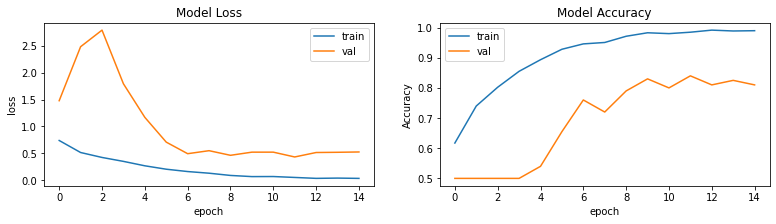

In [5]:
Train = False
if Train:
  history = model.fit(train_generator, validation_data=val_generator, epochs = 15)

  with open('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CatsDogs/history.json', 'w') as f:
      json.dump(history.history, f)

  model.save('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CatsDogs/model.h5')

  plt.figure(figsize=(13,3))
  plt.subplot(1,2,1)
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model Loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])

  plt.subplot(1,2,2)
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])
  plt.show()

else:
  model.load_weights('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CatsDogs/model.h5')

  with open('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CatsDogs/history.json', 'r') as f:
    history = json.load(f)

  plt.figure(figsize=(13,3))
  plt.subplot(1,2,1)
  plt.plot(history['loss'])
  plt.plot(history['val_loss'])
  plt.title('Model Loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])

  plt.subplot(1,2,2)
  plt.plot(history['accuracy'])
  plt.plot(history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])
  plt.show()

In [6]:
model.evaluate(test_generator)

7/7 [==============================] - 125s 16s/step - loss: 0.5872 - accuracy: 0.8175


[0.5183491110801697, 0.824999988079071]

### Visualize activations

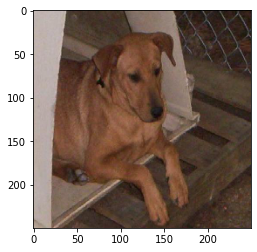

In [7]:
url = '/content/drive/MyDrive/CS577 - Deep Learning/HW4/Datasets/CatsDogs/PetImages/Dog/100.jpg'
img = image.load_img(url, target_size=(250, 250))
img_array = image.img_to_array(img)

# Get the same format as the inputs of the network (4 dims and normalized values)
img_array = np.reshape(img_array, newshape=(1,250,250,3))
img_array /= 255
plt.imshow(img_array[0])

In [8]:
model = None
model = tf.keras.models.load_model('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CatsDogs/model.h5')
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_25 (Conv2D)           (None, 248, 248, 16)      448       
_________________________________________________________________
batch_normalization_25 (Batc (None, 248, 248, 16)      64        
_________________________________________________________________
max_pooling2d_25 (MaxPooling (None, 124, 124, 16)      0         
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 122, 122, 32)      4640      
_________________________________________________________________
batch_normalization_26 (Batc (None, 122, 122, 32)      128       
_________________________________________________________________
max_pooling2d_26 (MaxPooling (None, 61, 61, 32)        0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 59, 59, 64)       

In [11]:
layers_activations = [layer.output for layer in model.layers[:8]]

activation_model = tf.keras.models.Model(inputs=model.input, outputs=layers_activations)

activations = activation_model.predict(img_array)

In [12]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 248, 248, 16)


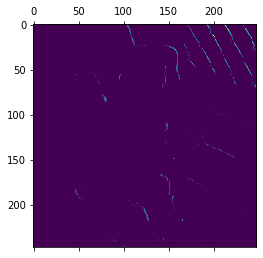

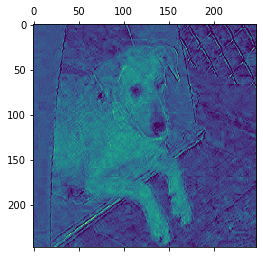

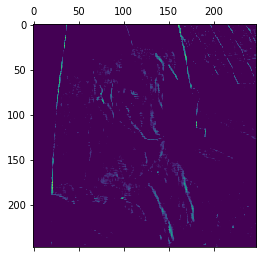

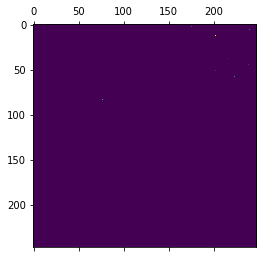

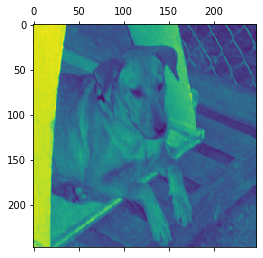

...

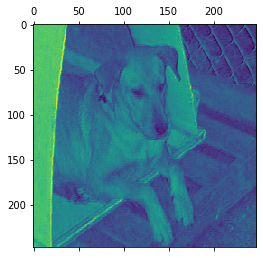

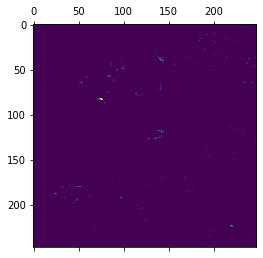

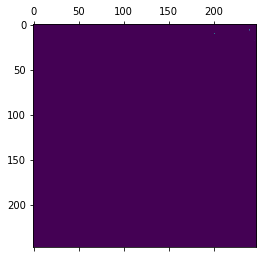

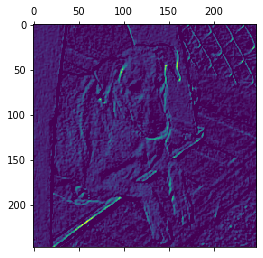

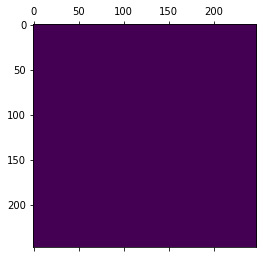

In [13]:
for i in range(16):
  plt.matshow(first_layer_activation[0,:,:,i], cmap='viridis')
  plt.show()

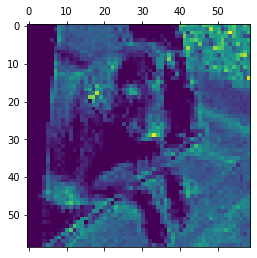

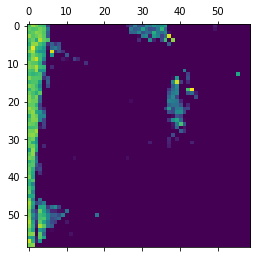

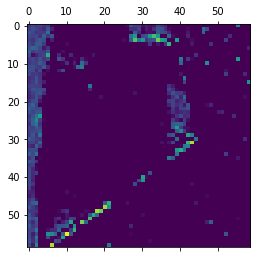

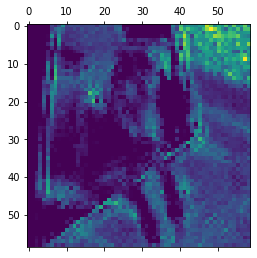

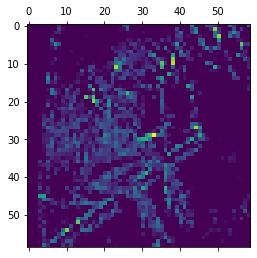

...

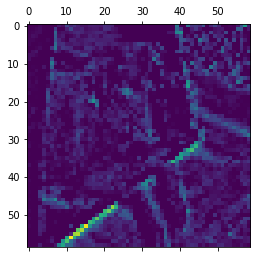

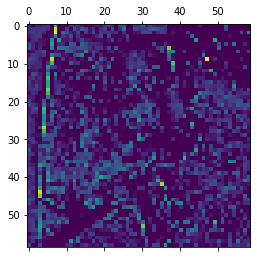

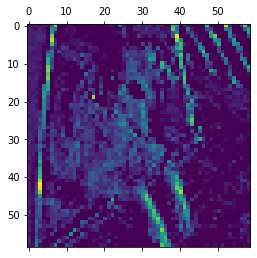

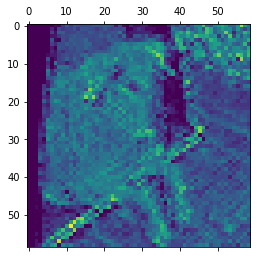

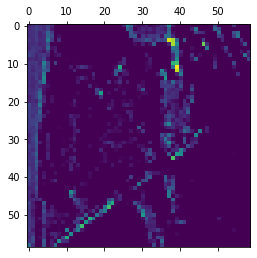

In [14]:
seventh_layer_activation = activations[6]

for i in range(16):
  plt.matshow(seventh_layer_activation[0,:,:,i*4], cmap='viridis')

### Visualize Filters


In [15]:
# The dimensions of our input image
img_width = 250
img_height = 250
# Our target layer: we will visualize the filters from this layer.
# See `model.summary()` for list of layer names, if you want to change this.
layer_name = "conv2d_27"

layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.inputs, outputs=layer.output)


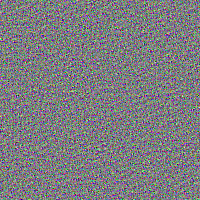

In [16]:
def compute_loss(input_image, filter_index):
    activation = feature_extractor(input_image)
    # We avoid border artifacts by only involving non-border pixels in the loss.
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    return tf.reduce_mean(filter_activation)

@tf.function
def gradient_ascent_step(img, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(img)
        loss = compute_loss(img, filter_index)
    # Compute gradients.
    grads = tape.gradient(loss, img)
    # Normalize gradients.
    grads = tf.math.l2_normalize(grads)
    img += learning_rate * grads
    return loss, img

def initialize_image():
    # We start from a gray image with some random noise
    img = tf.random.uniform((1, img_width, img_height, 3))
    # ResNet50V2 expects inputs in the range [-1, +1].
    # Here we scale our random inputs to [-0.125, +0.125]
    return (img - 0.5) * 0.25


def visualize_filter(filter_index):
    # We run gradient ascent for 20 steps
    iterations = 30
    learning_rate = 10.0
    img = initialize_image()
    for iteration in range(iterations):
        loss, img = gradient_ascent_step(img, filter_index, learning_rate)

    # Decode the resulting input image
    img = deprocess_image(img[0].numpy())
    return loss, img


def deprocess_image(img):
    # Normalize array: center on 0., ensure variance is 0.15
    img -= img.mean()
    img /= img.std() + 1e-5
    img *= 0.15

    # Center crop
    img = img[25:-25, 25:-25, :]

    # Clip to [0, 1]
    img += 0.5
    img = np.clip(img, 0, 1)

    # Convert to RGB array
    img *= 255
    img = np.clip(img, 0, 255).astype("uint8")
    return img

from IPython.display import Image, display

loss, img = visualize_filter(0)
keras.preprocessing.image.save_img("0.png", img)
display(Image("0.png"))

Processing filter 0
Processing filter 1
Processing filter 2
Processing filter 3
Processing filter 4
Processing filter 5
Processing filter 6
Processing filter 7
Processing filter 8
Processing filter 9
Processing filter 10
Processing filter 11
Processing filter 12
Processing filter 13
Processing filter 14
Processing filter 15
Processing filter 16
Processing filter 17
Processing filter 18
Processing filter 19
Processing filter 20
Processing filter 21
Processing filter 22
Processing filter 23
Processing filter 24
Processing filter 25
Processing filter 26
Processing filter 27
Processing filter 28
Processing filter 29
Processing filter 30
Processing filter 31
Processing filter 32
Processing filter 33
Processing filter 34
Processing filter 35
Processing filter 36
Processing filter 37
Processing filter 38
Processing filter 39
Processing filter 40
Processing filter 41
Processing filter 42
Processing filter 43
Processing filter 44
Processing filter 45
Processing filter 46
Processing filter 47
Pr

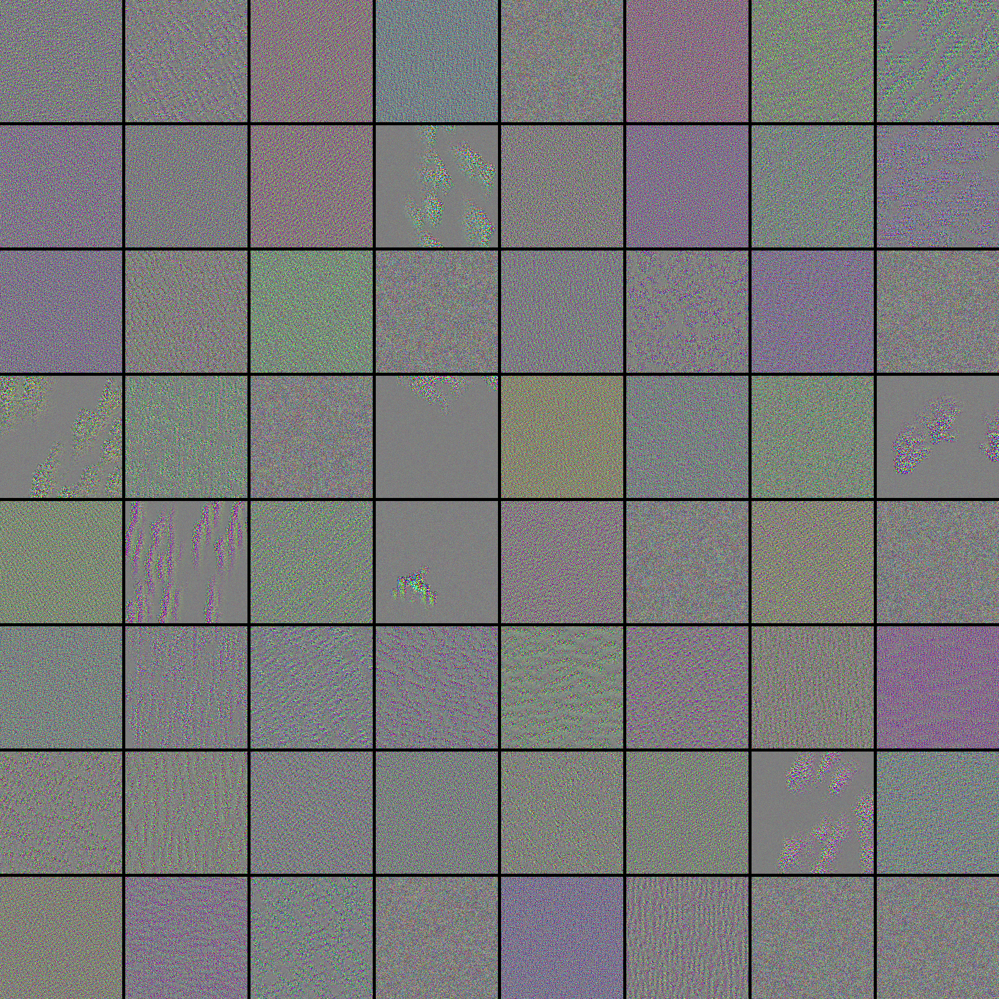

In [17]:
# Compute image inputs that maximize per-filter activations
# for the first 64 filters of our target layer
all_imgs = []
for filter_index in range(64):
    print("Processing filter %d" % (filter_index,))
    loss, img = visualize_filter(filter_index)
    all_imgs.append(img)

# Build a black picture with enough space for
# our 8 x 8 filters of size 128 x 128, with a 5px margin in between
margin = 5
n = 8
cropped_width = img_width - 25 * 2
cropped_height = img_height - 25 * 2
width = n * cropped_width + (n - 1) * margin
height = n * cropped_height + (n - 1) * margin
stitched_filters = np.zeros((width, height, 3))

# Fill the picture with our saved filters
for i in range(n):
    for j in range(n):
        img = all_imgs[i * n + j]
        stitched_filters[
            (cropped_width + margin) * i : (cropped_width + margin) * i + cropped_width,
            (cropped_height + margin) * j : (cropped_height + margin) * j
            + cropped_height,
            :,
        ] = img
keras.preprocessing.image.save_img("stiched_filters.png", stitched_filters)

from IPython.display import Image, display

display(Image("stiched_filters.png"))

### Test VGG16

In [18]:
from keras.applications import VGG16
conv_base = VGG16(weights='imagenet', include_top=False, input_shape=(250, 250, 3))
conv_base.trainable = False

model = None
model = tf.keras.models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(128, activation='relu', kernel_regularizer='l2'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(1, activation='sigmoid'))

model.summary()

58892288/58889256 [==============================] - 1s 0us/step
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               3211392   
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 64)                8256      
_________________________________________________________________
dropout_2 (Dropout)          (None, 64)                0         
_______________________________________________________

In [19]:
opt = optimizers.Adam(learning_rate=0.0001)

model.compile(optimizer=opt, loss="binary_crossentropy", metrics=['accuracy'])

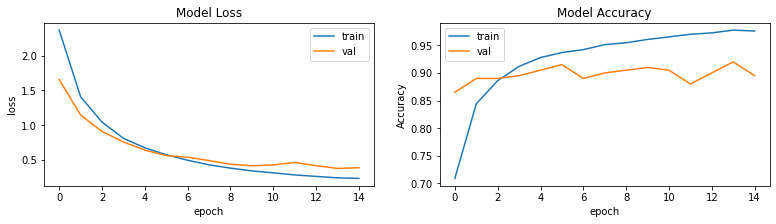

In [20]:
Train = False
if Train:
  history = model.fit(train_generator, validation_data=val_generator, epochs = 15)

  with open('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CatsDogs/history_vgg.json', 'w') as f:
      json.dump(history.history, f)

  model.save('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CatsDogs/model_vgg.h5')

  plt.figure(figsize=(13,3))
  plt.subplot(1,2,1)
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model Loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])

  plt.subplot(1,2,2)
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])
  plt.show()

else:
  model.load_weights('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CatsDogs/model_vgg.h5')

  with open('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CatsDogs/history_vgg.json', 'r') as f:
    history = json.load(f)

  plt.figure(figsize=(13,3))
  plt.subplot(1,2,1)
  plt.plot(history['loss'])
  plt.plot(history['val_loss'])
  plt.title('Model Loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])

  plt.subplot(1,2,2)
  plt.plot(history['accuracy'])
  plt.plot(history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])
  plt.show()

In [21]:
model.evaluate(test_generator)

7/7 [==============================] - 20s 928ms/step - loss: 0.2711 - accuracy: 0.9517


[0.2954108417034149, 0.9350000023841858]

In [22]:
conv_base.trainable = True

model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               3211392   
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 64)                8256      
_________________________________________________________________
dropout_2 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                

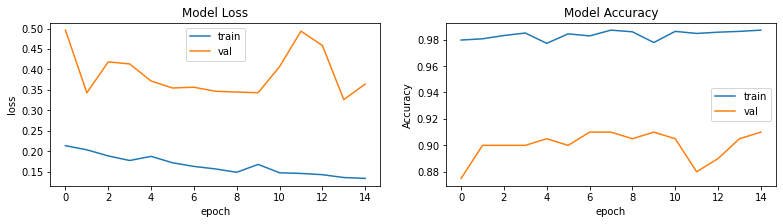

In [24]:
Train = False
if Train:
  history = model.fit(train_generator, validation_data=val_generator, epochs = 15)

  with open('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CatsDogs/history_vgg_ft.json', 'w') as f:
      json.dump(history.history, f)

  model.save('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CatsDogs/model_vgg_ft.h5')

  plt.figure(figsize=(13,3))
  plt.subplot(1,2,1)
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model Loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])

  plt.subplot(1,2,2)
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])
  plt.show()

else:
  model.load_weights('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CatsDogs/model_vgg_ft.h5')

  with open('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CatsDogs/history_vgg_ft.json', 'r') as f:
    history = json.load(f)

  plt.figure(figsize=(13,3))
  plt.subplot(1,2,1)
  plt.plot(history['loss'])
  plt.plot(history['val_loss'])
  plt.title('Model Loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])

  plt.subplot(1,2,2)
  plt.plot(history['accuracy'])
  plt.plot(history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])
  plt.show()

In [25]:
model.evaluate(test_generator)

7/7 [==============================] - 2s 292ms/step - loss: 0.3463 - accuracy: 0.9400


[0.3463118076324463, 0.9399999976158142]

In [26]:
train = ImageDataGenerator(rescale=1./255,rotation_range = 40,width_shift_range = 0.25, height_shift_range = 0.25, shear_range = 0.15, zoom_range = 0.3, horizontal_flip = True)
val = ImageDataGenerator(rescale=1./255)
test = ImageDataGenerator(rescale=1./255)

url = '/content/drive/MyDrive/CS577 - Deep Learning/HW4/Datasets/CatsDogs/subset/'

batch_size = 32

print( os.listdir(url+'Train'))
#shutil.rmtree(url+'Train' + '/.ipynb_checkpoints')

train_generator = train.flow_from_directory(directory=url+'Train', target_size=(250, 250),  batch_size=batch_size, class_mode='binary')

print( os.listdir(url+'Train'))
#shutil.rmtree(url+'Val' + '/.ipynb_checkpoints')

val_generator = val.flow_from_directory(directory=url+'Val', target_size=(250, 250),  batch_size=batch_size, class_mode='binary')

print( os.listdir(url+'Val'))
#shutil.rmtree(url+'Test' + '/.ipynb_checkpoints')

test_generator = test.flow_from_directory(directory=url+'Test', target_size=(250, 250),  batch_size=batch_size, class_mode='binary')

['Cat', 'Dog']
Found 3200 images belonging to 2 classes.
['Cat', 'Dog']
Found 200 images belonging to 2 classes.
['Cat', 'Dog']
Found 200 images belonging to 2 classes.


In [27]:
conv_base = VGG16(weights='imagenet', include_top=False, input_shape=(250, 250, 3))
conv_base.trainable = False

model = None
model = tf.keras.models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(1, activation='sigmoid'))

model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten_2 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_5 (Dense)              (None, 128)               3211392   
_________________________________________________________________
dropout_3 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 64)                8256      
_________________________________________________________________
dropout_4 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 1)                

In [28]:
opt = optimizers.Adam(learning_rate=0.0001)

model.compile(optimizer=opt, loss="binary_crossentropy", metrics=['accuracy'])

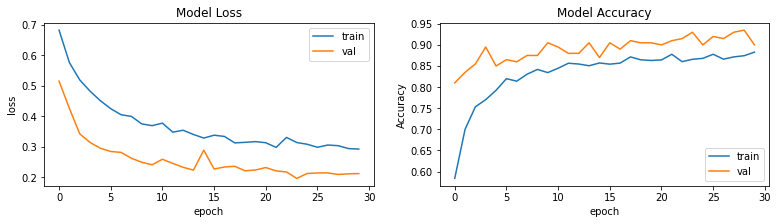

In [29]:
Train = False
if Train:
  history = model.fit(train_generator, validation_data=val_generator, epochs = 30)

  with open('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CatsDogs/history_vgg_da.json', 'w') as f:
      json.dump(history.history, f)

  model.save('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CatsDogs/model_vgg_da.h5')

  plt.figure(figsize=(13,3))
  plt.subplot(1,2,1)
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model Loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])

  plt.subplot(1,2,2)
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])
  plt.show()

else:
  model.load_weights('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CatsDogs/model_vgg_da.h5')

  with open('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CatsDogs/history_vgg_da.json', 'r') as f:
    history = json.load(f)

  plt.figure(figsize=(13,3))
  plt.subplot(1,2,1)
  plt.plot(history['loss'])
  plt.plot(history['val_loss'])
  plt.title('Model Loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])

  plt.subplot(1,2,2)
  plt.plot(history['accuracy'])
  plt.plot(history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])
  plt.show()

In [30]:
model.evaluate(test_generator)

7/7 [==============================] - 3s 292ms/step - loss: 0.1036 - accuracy: 0.9594


[0.1222890317440033, 0.949999988079071]

# Question 2: Multiclass Evaluation

In [31]:
X = []
Y = []
for i in range(5):
  with open('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Datasets/CIFAR10/cifar-10-batches-py/data_batch_'+str(i+1), 'rb') as fo:
   dict = pickle.load(fo, encoding='bytes')
  for i in range(len(dict[b'labels'])):
    X.append(dict[b'data'][i])
    Y.append(dict[b'labels'][i])

X = np.vstack(X) 
Y = np.vstack(Y) 

X = np.reshape(X, newshape=(50000, 32, 32, 3)) / 255
Y = to_categorical(Y)

In [33]:
# Not need to shuffle (it is already)
n_train = int(0.7*X.shape[0])

X_train = X[:n_train,:,:,:]
Y_train = Y[:n_train,:,]

X_val = X[n_train:,:,:,:]
Y_val = Y[n_train:,:]

In [34]:
model = tf.keras.models.Sequential()

model.add(layers.Conv2D(32, (3,3), activation='relu', kernel_regularizer=keras.regularizers.L2(0.05), input_shape=(32,32,3)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(64, (3,3), activation='relu',kernel_regularizer=keras.regularizers.L2(0.05)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(128, (3,3), activation='relu',kernel_regularizer=keras.regularizers.L2(0.05)))
model.add(layers.BatchNormalization())

model.add(layers.Flatten())
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(10, activation='softmax'))

model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 30, 30, 32)        896       
_________________________________________________________________
batch_normalization_5 (Batch (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 13, 13, 64)        18496     
_________________________________________________________________
batch_normalization_6 (Batch (None, 13, 13, 64)        256       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 4, 4, 128)        

In [35]:
opt = optimizers.Adam(learning_rate=0.0001)

model.compile(optimizer=opt, loss="categorical_crossentropy", metrics=['accuracy'])

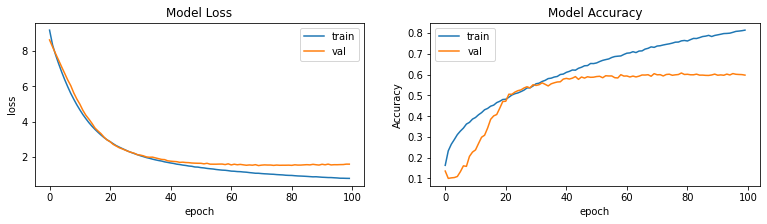

In [36]:
Train = False
if Train:
  history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs = 100, batch_size = 1024)

  with open('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CIFAR10/history_cifar.json', 'w') as f:
      json.dump(history.history, f)

  model.save('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CIFAR10/model_cifar.h5')

  plt.figure(figsize=(13,3))
  plt.subplot(1,2,1)
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model Loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])

  plt.subplot(1,2,2)
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])
  plt.show()

else:
  model.load_weights('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CIFAR10/model_cifar.h5')

  with open('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CIFAR10/history_cifar.json', 'r') as f:
    history = json.load(f)

  plt.figure(figsize=(13,3))
  plt.subplot(1,2,1)
  plt.plot(history['loss'])
  plt.plot(history['val_loss'])
  plt.title('Model Loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])

  plt.subplot(1,2,2)
  plt.plot(history['accuracy'])
  plt.plot(history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])
  plt.show()

In [37]:
## TEST
X_test = []
Y_test = []
with open('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Datasets/CIFAR10/cifar-10-batches-py/test_batch', 'rb') as fo:
   dict = pickle.load(fo, encoding='bytes')
   for i in range(len(dict[b'labels'])):
      X_test.append(dict[b'data'][i])
      Y_test.append(dict[b'labels'][i])

X_test = np.vstack(X_test) 
Y_test = np.vstack(Y_test)

X_test = np.reshape(X_test, newshape=(X_test.shape[0], 32, 32, 3)) / 255
Y_test = to_categorical(Y_test)

In [38]:
model.evaluate(X_test,Y_test)

313/313 [==============================] - 2s 5ms/step - loss: 1.6114 - accuracy: 0.5908


[1.619449496269226, 0.5942000150680542]

In [39]:
def Inception_Block(input_layer, neurons):
    
    
    branch_a = layers.Conv2D(neurons, 1, padding='same', activation='relu')(input_layer)

    branch_b = layers.Conv2D(neurons, 1, padding='same', activation='relu')(input_layer)
    branch_b = layers.Conv2D(neurons, 3, padding='same', activation='relu')(branch_b)

    branch_c = layers.Conv2D(neurons, 1, padding='same', activation='relu')(input_layer)
    branch_c = layers.Conv2D(neurons, 5, padding='same', activation='relu')(branch_c)

    branch_d = layers.MaxPooling2D(2, padding='same', strides=(1,1))(input_layer)
    branch_d = layers.Conv2D(neurons, 1, padding='same', activation='relu')(branch_d)
    
    block = layers.concatenate([branch_a, branch_b, branch_c, branch_d], axis = -1)
    
    return block



In [50]:
# Input 
input_tensor = layers.Input(shape=(32,32,3))

x = layers.Conv2D(32, (3,3), activation='relu',kernel_regularizer=keras.regularizers.L2(0.05))(input_tensor)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2,2))(x)

x = layers.Conv2D(64, (3,3), activation='relu',kernel_regularizer=keras.regularizers.L2(0.05))(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2,2))(x)

x = layers.Conv2D(128, (3,3), activation='relu', kernel_regularizer=keras.regularizers.L2(0.05))(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2,2))(x)

x = Inception_Block(x, 32)

# FC
x = layers.Flatten()(x)
x = layers.Dense(32, activation='relu')(x)
x = layers.Dropout(0.5)(x)
output = layers.Dense(10, activation='softmax')(x)

# Output
model = keras.Model(inputs=input_tensor, outputs=output)

model.summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_25 (Conv2D)              (None, 30, 30, 32)   896         input_5[0][0]                    
__________________________________________________________________________________________________
batch_normalization_18 (BatchNo (None, 30, 30, 32)   128         conv2d_25[0][0]                  
__________________________________________________________________________________________________
max_pooling2d_15 (MaxPooling2D) (None, 15, 15, 32)   0           batch_normalization_18[0][0]     
____________________________________________________________________________________________

In [51]:
opt = optimizers.Adam(learning_rate=0.0001)

model.compile(optimizer=opt, loss="categorical_crossentropy", metrics=['accuracy'])

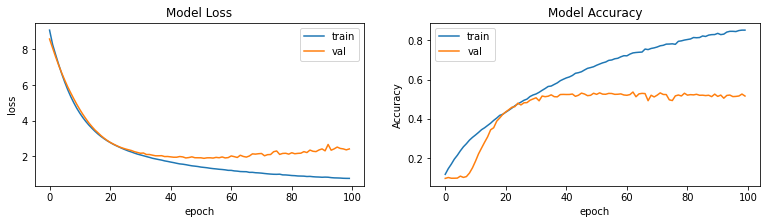

In [52]:
Train = False

if Train:
  history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs = 100, batch_size = 1024)

  with open('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CIFAR10/history_cifar_inc.json', 'w') as f:
      json.dump(history.history, f)

  model.save('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CIFAR10/model_cifar_inc.h5')

  plt.figure(figsize=(13,3))
  plt.subplot(1,2,1)
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model Loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])

  plt.subplot(1,2,2)
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])
  plt.show()

else:
  model.load_weights('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CIFAR10/model_cifar_inc.h5')

  with open('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CIFAR10/history_cifar_inc.json', 'r') as f:
    history = json.load(f)

  plt.figure(figsize=(13,3))
  plt.subplot(1,2,1)
  plt.plot(history['loss'])
  plt.plot(history['val_loss'])
  plt.title('Model Loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])

  plt.subplot(1,2,2)
  plt.plot(history['accuracy'])
  plt.plot(history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])
  plt.show()

In [53]:
model.evaluate(X_test,Y_test)

313/313 [==============================] - 2s 6ms/step - loss: 2.4385 - accuracy: 0.5089


[2.4473459720611572, 0.5099999904632568]

In [44]:
def residual_stack(x, f):
    
    if x.shape[1] != f:
        x = layers.Conv2D(f, 1, strides=1, padding='same',activation='relu', data_format='channels_last')(x)
        x = layers.BatchNormalization()(x)
    
    # residual unit 1    
    x_shortcut = x
    x = layers.Conv2D(f, 5, strides=1, padding="same", activation='relu',data_format='channels_last')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(f, 5, strides=1, padding="same", data_format='channels_last')(x)
    x = layers.BatchNormalization()(x)
    
    # add skip connection
    if x.shape[1] == x_shortcut.shape[1]:
        x = layers.Add()([x, x_shortcut])
    else:
        raise Exception('Skip Connection Failure!')
    
    x = layers.Activation('relu')(x)  
    # residual unit 2    
    x_shortcut = x
    x = layers.Conv2D(f, 5, strides=1, padding="same", activation='relu', data_format='channels_last')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(f, 5, strides = 1, padding = "same", data_format='channels_last')(x)
    
    # add skip connection
    if x.shape[1] == x_shortcut.shape[1]:
        x = layers.Add()([x, x_shortcut])
    else:
          raise Exception('Skip Connection Failure!')
    x = layers.Activation('relu')(x)  
    # max pooling layer
    x = layers.MaxPooling2D(pool_size=2, strides=None, padding='valid', data_format='channels_last')(x)
    return x


In [45]:
# Input 
input_tensor = layers.Input(shape=(32,32,3))

x = layers.Conv2D(32, (3,3), activation='relu',kernel_regularizer=keras.regularizers.L2(0.05))(input_tensor)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2,2))(x)

x = layers.Conv2D(64, (3,3), activation='relu',kernel_regularizer=keras.regularizers.L2(0.05))(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2,2))(x)

x = layers.Conv2D(128, (3,3), activation='relu', kernel_regularizer=keras.regularizers.L2(0.05))(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2,2))(x)

x = residual_stack(x, 32)

# FC
x = layers.Flatten()(x)
x = layers.Dense(32, activation='relu')(x)
x = layers.Dropout(0.5)(x)
output = layers.Dense(10, activation='softmax')(x)

# Output
model = keras.Model(inputs=input_tensor, outputs=output)

model.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_17 (Conv2D)              (None, 30, 30, 32)   896         input_4[0][0]                    
__________________________________________________________________________________________________
batch_normalization_11 (BatchNo (None, 30, 30, 32)   128         conv2d_17[0][0]                  
__________________________________________________________________________________________________
max_pooling2d_11 (MaxPooling2D) (None, 15, 15, 32)   0           batch_normalization_11[0][0]     
____________________________________________________________________________________________

In [46]:
opt = optimizers.Adam(learning_rate=0.0001)

model.compile(optimizer=opt, loss="categorical_crossentropy", metrics=['accuracy'])

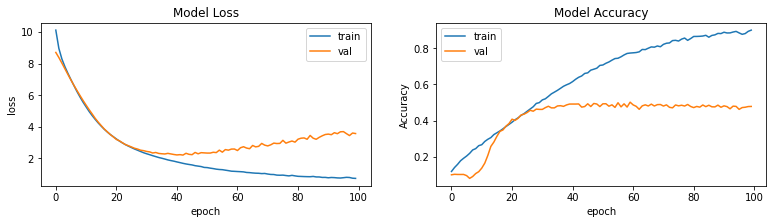

In [48]:
Train = False

if Train:
  history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs = 100, batch_size = 1024)

  with open('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CIFAR10/history_cifar_res.json', 'w') as f:
      json.dump(history.history, f)

  model.save('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CIFAR10/model_cifar_res.h5')

  plt.figure(figsize=(13,3))
  plt.subplot(1,2,1)
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model Loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])

  plt.subplot(1,2,2)
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])
  plt.show()

else:
  model.load_weights('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CIFAR10/model_cifar_res.h5')

  with open('/content/drive/MyDrive/CS577 - Deep Learning/HW4/Models/CIFAR10/history_cifar_res.json', 'r') as f:
    history = json.load(f)

  plt.figure(figsize=(13,3))
  plt.subplot(1,2,1)
  plt.plot(history['loss'])
  plt.plot(history['val_loss'])
  plt.title('Model Loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])

  plt.subplot(1,2,2)
  plt.plot(history['accuracy'])
  plt.plot(history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'])
  plt.show()

In [49]:
model.evaluate(X_test,Y_test)

313/313 [==============================] - 2s 6ms/step - loss: 3.5573 - accuracy: 0.4826


[3.5572891235351562, 0.48260000348091125]